# Capstone

## Battle of Neighbourhoods

### Chinese restaurants in NY

#### Introduction

 <font size="4"> 
    
 During recent decades China has experienced fast economic growth. This resulted in the expansion of Chinese cuisine worldwide. 
 The development of Chinese restaurants and food chains can be stimulated by the 
 two factors. First, there the number of tourists and immigrants from China 
 is apparently increasing in Western Europe and US. Second, Chinese cuisine becomes more and more popular
 among people of non-Chinese origin. Therefore, opening the Chinese  restaurant in one of the 
 major cities seems to the a plausible business project.  The choice of New York City
 is motivated by the fact that it hosts the larges Chinese-American population of any city proper, with over half a million (Wikipedia). 
 To figure out which location for such a restaurant would be more profitable we will analyze the available data on existing restaurants of the 
 same type in different New York neighborhoods and boroughs.
    </font>
    

#### Target audience and importance

<font size="4"> 
    
Suggested analysis will be interesting for the two groups of target audience. First, they are NY locals and visitors who like Chinese cuisine. Second, they are potential investors who think of starting the restaurant business in NY. 
</font>

#### Data

<font size="4"> 
    
- Data on New York City neighborhoods, boroughs to 
include boundaries, latitude, longitude, restaurants, and restaurant ratings and tips are required.
- New York City data containing the neighborhoods and boroughs, latitudes, and longitudes will be 
obtained from the data source: https://cocl.us/new_york_dataset
- New York City data containing neighborhood boundaries will be obtained from the data source: 
https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm
- All data related to locations and quality of Italian restaurants will be obtained via the 
FourSquare API utilized via the Request library in Python.
</font>

#### Methodology

<font size="4">

  - We will download the data from https://cocl.us/new_york_dataset and cleaned transform it into a dataframe.
  - We will use FourSquare to find Chinese restaurants and get their ratings, tips, and likes. This information will be added to the dataframe.
  - Data will be presented using different visualisation tools available in Python.
</font>

#### Problem Statement

<font size="4">
    
- Where are the most popular Chinese cuisine restaurant are located in New York City?
- Which location is optimal for opening the new Chinese restaurant in New York City ?
</font>

#### Example of what features can be extracted from the data

Neighborhoods in NY and their coordinates

In [69]:
ny_data = get_new_york_data()
ny_data.head()


,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


#### Results

List of Chinese restaurants in each neighborhood in NY

In [20]:
chinese_rest_stats_ny.sort_values(['Rating'],ascending=False)

,Unnamed: 0,Borough,Neighborhood,ID,Name,Likes,Rating,Tips
54,82,Manhattan,Chelsea,44e9b421f964a520a5371fe3,Buddakan,1473.0,9.2,519.0
67,95,Manhattan,West Village,526eeb54498e9674b5d9034a,Decoy,332.0,9.1,106.0
107,167,Manhattan,Flatiron,59035bc43d47912d4b97f3fc,Xi'an Famous Foods,206.0,9.1,43.0
62,90,Manhattan,Lower East Side,5b380f649deb7d00399fdf9d,Kings County Imperial,66.0,9.1,9.0
79,107,Queens,Long Island City,5c9a607d25fb7b002c724043,Xi'an Famous Foods,24.0,9.0,6.0
...,...,...,...,...,...,...,...,...
49,77,Manhattan,Lincoln Square,4aed1141f964a52001cd21e3,Wok City,8.0,5.8,13.0
103,160,Bronx,Claremont Village,4ca3bffa1ee76dcb1ee6fbdd,Empire King Chinese Food,3.0,5.7,2.0
100,146,Brooklyn,Ditmas Park,4af378def964a520f8ed21e3,Bo Bo Kitchen,3.0,5.7,5.0
9,27,Brooklyn,Brooklyn Heights,4a986a9cf964a520e82b20e3,Great Wall Chinese Food,4.0,5.6,9.0


Number of Chinese restaurants per borough

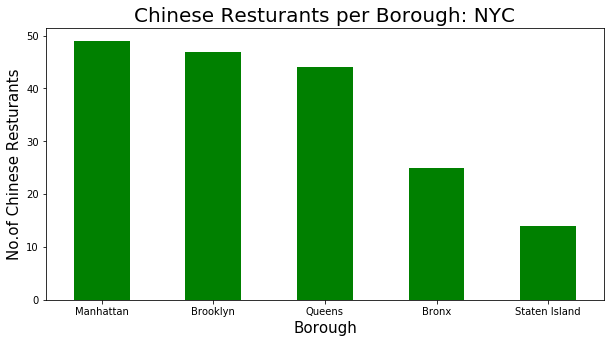

<Figure size 432x288 with 0 Axes>

In [41]:
chinese_rest_ny.groupby('Borough')['ID'].count().nlargest(5).plot.bar(figsize=(10,5), color = 'green')
plt.title('Chinese Resturants per Borough: NYC', fontsize = 20)
plt.xlabel('Borough', fontsize = 15)
plt.ylabel('No.of Chinese Resturants', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()
plt.savefig('Fig1.png')

Number of Chinese restaurants per neighborhood

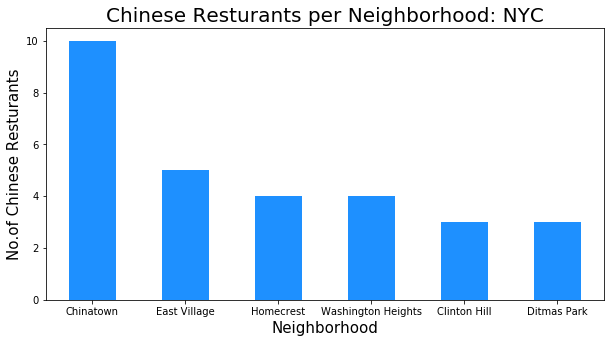

<Figure size 432x288 with 0 Axes>

In [42]:
clr= "dodgerblue"
NOofNeigh = 6 # top number for graphing all the same past 6
chinese_rest_ny.groupby('Neighborhood')['ID'].count().nlargest(NOofNeigh).plot.bar(figsize=(10,5), color=clr)
plt.title('Chinese Resturants per Neighborhood: NYC', fontsize = 20)
plt.xlabel('Neighborhood', fontsize = 15)
plt.ylabel('No.of Chinese Resturants', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()
plt.savefig('Fig2.png')

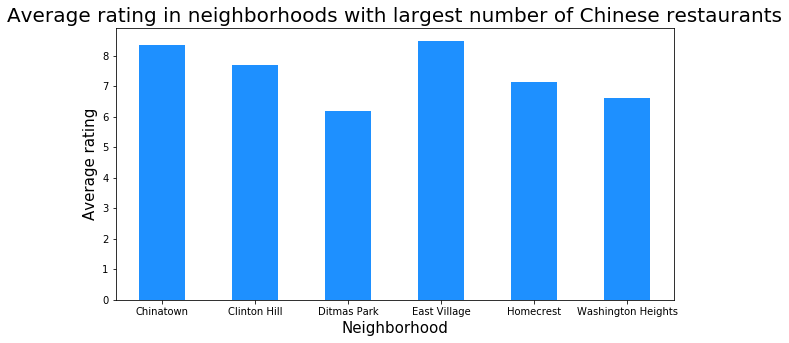

<Figure size 432x288 with 0 Axes>

In [43]:
clr= "dodgerblue"
Neighbourgoods= ['East Village', 'Chinatown', 'Homecrest', 'Washington Heights', 'Clinton Hill', 'Ditmas Park'] 
Best10Neighborhoods=chinese_rest_stats_ny.loc[chinese_rest_stats_ny['Neighborhood'].isin(Neighbourgoods)]

clr= "dodgerblue"
#NOofNeigh = 6 # top number for graphing all the same past 6
Best10Neighborhoods.groupby('Neighborhood').mean()['Rating'].plot.bar(figsize=(10,5), color=clr)

#Best10Neighborhoods.groupby('Neighborhood')['ID'].count().plot.bar(figsize=(25,5), color=clr)
plt.title('Average rating in neighborhoods with largest number of Chinese restaurants', fontsize = 20)
plt.xlabel('Neighborhood', fontsize = 15)
plt.ylabel('Average rating', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()
plt.savefig('Fig3.png')

In [36]:
ny_data[ny_data['Neighborhood']=='Ditmas Park']
#chinese_rest_stats_ny[chinese_rest_stats_ny['Neighborhood']=='Chinatown'].mean()['Rating']

,Borough,Neighborhood,Latitude,Longitude
221,Brooklyn,Ditmas Park,40.643675,-73.961013


In [33]:
ny_data[ny_data['Neighborhood']=='East Village']
#chinese_rest_stats_ny[chinese_rest_stats_ny['Neighborhood']=='East Village'].mean()['Rating']

,Borough,Neighborhood,Latitude,Longitude
118,Manhattan,East Village,40.727847,-73.982226


In [34]:
ny_data[ny_data['Neighborhood']=='Homecrest']
#chinese_rest_stats_ny[chinese_rest_stats_ny['Neighborhood']=='Homecrest'].mean()['Rating']

,Borough,Neighborhood,Latitude,Longitude
289,Brooklyn,Homecrest,40.598525,-73.959185


In [35]:
ny_data[ny_data['Neighborhood']=='Chinatown']
#chinese_rest_stats_ny[chinese_rest_stats_ny['Neighborhood']=='Chinatown'].mean()['Rating']

,Borough,Neighborhood,Latitude,Longitude
100,Manhattan,Chinatown,40.715618,-73.994279


In [37]:
ny_data[ny_data['Neighborhood']=='Washington Heights']

,Borough,Neighborhood,Latitude,Longitude
101,Manhattan,Washington Heights,40.851903,-73.9369


In [38]:
ny_data[ny_data['Neighborhood']=='Clinton Hill']

,Borough,Neighborhood,Latitude,Longitude
84,Brooklyn,Clinton Hill,40.693229,-73.967843


Average rating of Chinese restaurants for each Borough

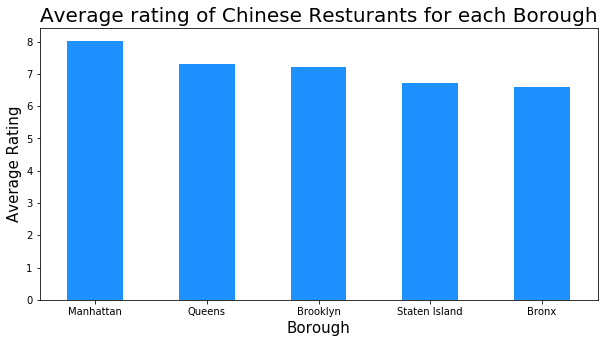

<Figure size 432x288 with 0 Axes>

In [44]:
chinese_rest_stats_ny.groupby('Borough').mean()['Rating'].nlargest(5).plot.bar(figsize=(10,5), color=clr)
plt.title('Average rating of Chinese Resturants for each Borough', fontsize=20)
#On x-axis
plt.xlabel('Borough', fontsize = 15)
#On y-axis
plt.ylabel('Average Rating', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()
plt.savefig('Fig4.png')

Now find neighborhoods with baste rated Chinese restaurants

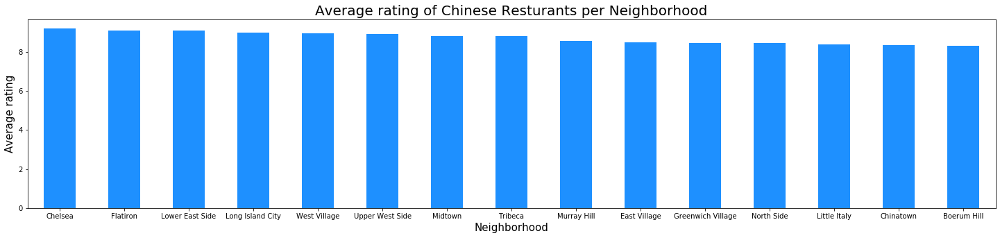

<Figure size 432x288 with 0 Axes>

In [45]:
clr= "dodgerblue"
NOofNeigh = 15 # top number for graphing all the same past 6
chinese_rest_stats_ny.groupby('Neighborhood').mean()['Rating'].nlargest(NOofNeigh).plot.bar(figsize=(25,5), color=clr)
plt.title('Average rating of Chinese Resturants per Neighborhood', fontsize = 20)
plt.xlabel('Neighborhood', fontsize = 15)
plt.ylabel('Average rating', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()
plt.savefig('Fig5.png')

Examine the number of restaurants in each neighborhood with high rating

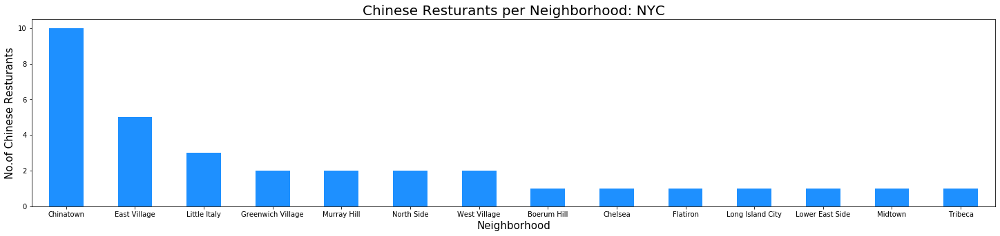

<Figure size 432x288 with 0 Axes>

In [46]:
clr= "dodgerblue"
Neighbourgoods= ['Chelsea', 'Flatiron', 'Lower East Side', 'Long Island City', 'West Village', 'Upper West Willage', 'Midtown', 'Tribeca', 'Murray Hill', 'East Village', 'Greenwich Village', 'North Side', 'Little Italy', 'Chinatown', 'Boerum Hill'] 
Best10Neighborhoods=chinese_rest_stats_ny.loc[chinese_rest_stats_ny['Neighborhood'].isin(Neighbourgoods)]

clr= "dodgerblue"
#NOofNeigh = 6 # top number for graphing all the same past 6
Best10Neighborhoods.groupby('Neighborhood')['ID'].count().nlargest(15).plot.bar(figsize=(25,5), color=clr)
#Best10Neighborhoods.groupby('Neighborhood')['ID'].count().plot.bar(figsize=(25,5), color=clr)
plt.title('Chinese Resturants per Neighborhood: NYC', fontsize = 20)
plt.xlabel('Neighborhood', fontsize = 15)
plt.ylabel('No.of Chinese Resturants', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()
plt.savefig('Fig6.png')

In [11]:
ny_data[ny_data['Neighborhood']=='East Village']

,Borough,Neighborhood,Latitude,Longitude
118,Manhattan,East Village,40.727847,-73.982226


Find the restaurants with maximum rating, likes and tips

Plot neighborhoods with high ratings on the map 

In [ ]:
from IPython.display import Image
Image(filename='./BNChineseRestaurant.png')

In [46]:
chinese_rest_stats_ny.iloc[chinese_rest_stats_ny['Rating'].idxmax()]

Unnamed: 0                            82
Borough                        Manhattan
Neighborhood                     Chelsea
ID              44e9b421f964a520a5371fe3
Name                            Buddakan
Likes                               1473
Rating                               9.2
Tips                                 519
Name: 54, dtype: object

In [35]:
chinese_rest_stats_ny.iloc[chinese_rest_stats_ny['Likes'].idxmax()]

Unnamed: 0                            82
Borough                        Manhattan
Neighborhood                     Chelsea
ID              44e9b421f964a520a5371fe3
Name                            Buddakan
Likes                               1473
Rating                               9.2
Tips                                 519
Name: 54, dtype: object

In [36]:
chinese_rest_stats_ny.iloc[chinese_rest_stats_ny['Tips'].idxmax()]

Unnamed: 0                            57
Borough                        Manhattan
Neighborhood                   Chinatown
ID              3fd66200f964a52067e61ee3
Name                  Joe's Shanghai 鹿嗚春
Likes                               1302
Rating                               8.5
Tips                                 567
Name: 29, dtype: object

Show color map of NY boroughs and neighborhoods according to the average rating of Chinese restaurants. Blue, red markers show neighborhoods with 
rating >8, between 5 and 8, respectively. There are no restaurants with rating smaller than 5

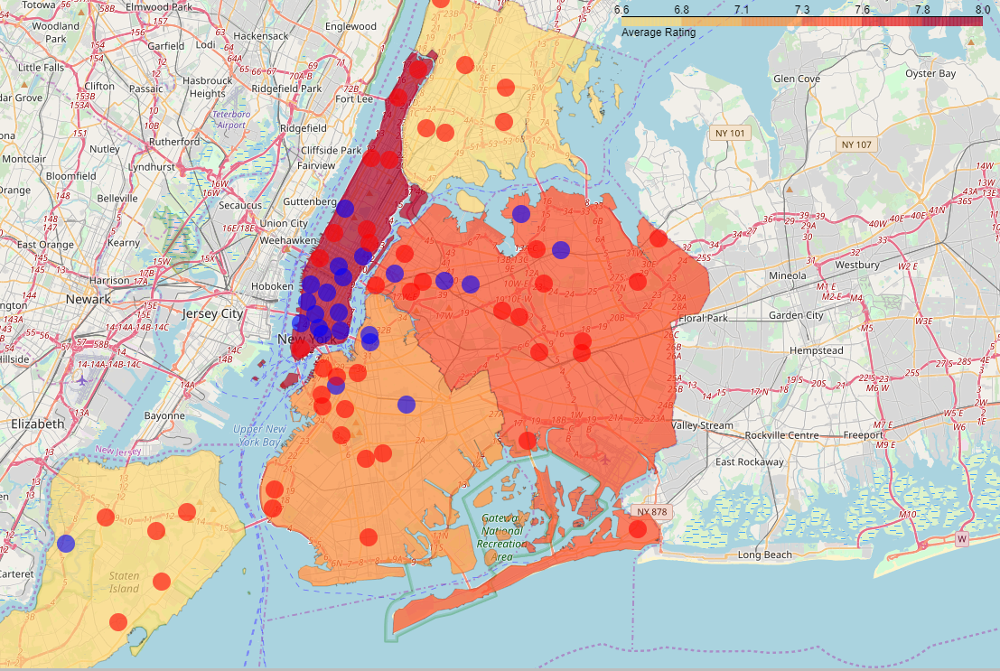

In [68]:
#from IPython.display import IFrame
#IFrame(src='./borough_rating.html', width=1200, height=1000)

from IPython.display import Image
Image(filename='./NYMapGoodBadRest.png')

Calculate neighborhoods with no Chinese restaurants. Red, blue, black and green markers correspond to Manhattan, Bronx, Queens and Brooklyn, respectively 

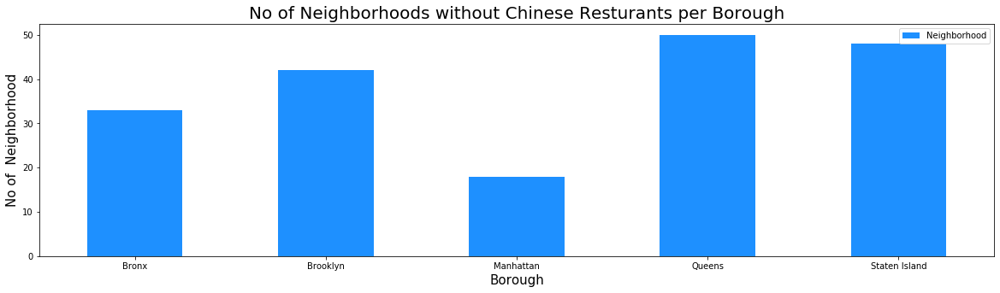

<Figure size 432x288 with 0 Axes>

In [48]:
ny_data = get_new_york_data()
chinese_rest_ny = pd.read_csv('chinese_rest_ny_tocsv1.csv')
chinese_rest_ny = chinese_rest_ny[(chinese_rest_ny.ID != '0')]
chinese_rest_ny.index = range(len(chinese_rest_ny))
#ny_data.head()
column_names=['Borough', 'Neighborhood']
NOchinese_rest_ny=pd.DataFrame(columns=column_names)
count=1
for row in ny_data.values.tolist():
    Borough, Neighborhood, Latitude, Longitude=row
    if ((Neighborhood in chinese_rest_ny['Neighborhood'].values.tolist())==False):
        NOchinese_rest_ny = NOchinese_rest_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                     }, ignore_index=True)

clr= "dodgerblue"
NOofNeigh = 10 # top number for graphing all the same past 6
NOchinese_rest_ny.groupby('Borough').count().plot.bar(figsize=(20,5), color=clr)
plt.title('No of Neighborhoods without Chinese Resturants per Borough', fontsize = 20)
plt.xlabel('Borough', fontsize = 15)
plt.ylabel('No of  Neighborhood', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()
plt.savefig('Fig6.png')

Show the map of neighborhoods with no Chinese restaurants. Red, blue, black and green markers correspond to Manhattan, Bronx, Queens and Brooklyn, respectively 

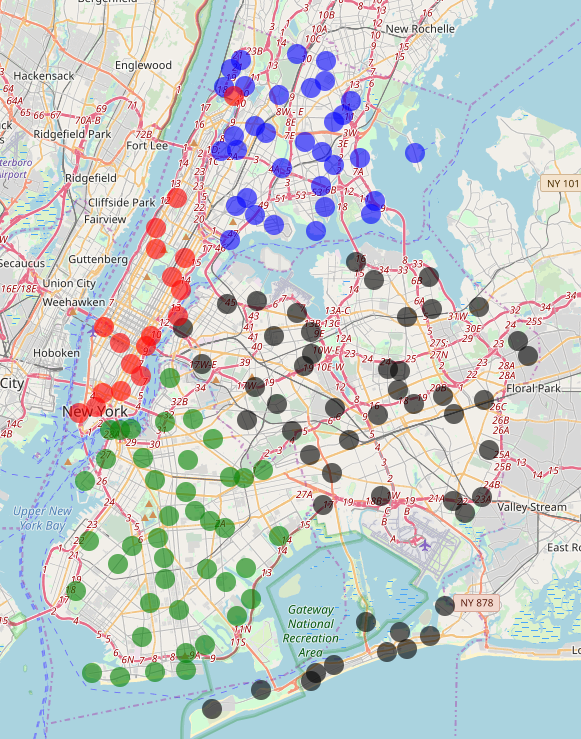

In [24]:
#from IPython.display import IFrame
#IFrame(src='./NoChineseRestaurant.html', width=1200, height=1000)
from IPython.display import Image
Image(filename='./NYMapNoRest.png')

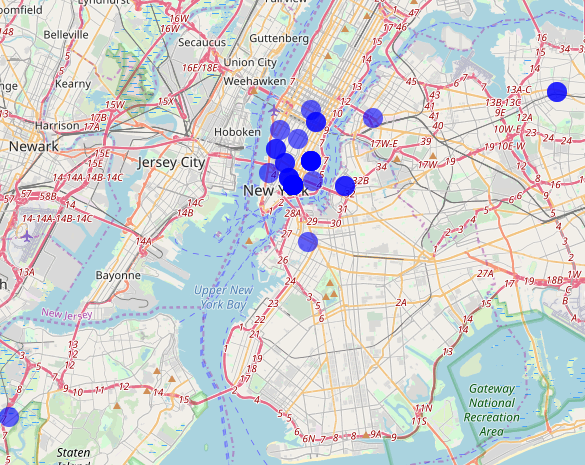

In [27]:
from IPython.display import Image
Image(filename='./NYMapBestRest.png')

#### Discussion

One can see that Brooklyn, Manhattan and Queens have almost the same overall number of Chinese restaurants. Interestingly, the average rating is also the same for these districts.  However, these boroughs have qualitatively different distribution of neighborhoods according the the rating of Chinese restaurants. This is evident from the map which shows restaurants with ratings in range above 8 and between 5 and 8 with blue and red markers, respectively. Manhattan and in particular its southern part has many Chinese restaurants with rating larger than 8 (blue markers). The neighborhood with largest average rating, Chelsea is located in there, in Manhattan. However, the is only one restaurant named Buddakan in Chelsea . This restaurant however has largest rating and the largest number of likes. Similarly, among 5 best rated neighborhood only one (West Village) has two restaurants and others, 'Chelsea', 'Flatiron', 'Lower East Side', 'Long Island City', 'West Village' have only one Chinese restaurant each. 

On the other hand, neighborhoods with large number of restaurants have typically lower average rating.The only exception is Chinatown and East Village having 10 and 5 restaurants, respectively with average ratings above 8. Other neighborhoods with large number of Chinese restaurants Homecrest (Brooklyn, 4 restaurants), Clinton Hill (Brooklyn, 3 restaurants), Ditmas Park (Brooklyn, 3 restaurants), Washington height (Manhattan, 4 restaurants) have average ratings significantly below 8. 

Regarding other boroughs, Queens has significantly smaller number of neighborhoods with ratings >8 than Manhattan. Similarly Bronx has even less, that is only 4 neighborhoods with rating >8. At the same time in Brooklyn and Bronx the quality of restaurants is more homogeneously distributed among different neighborhoods. Indeed, as one can notice examining the map, Manhattan has large disproportion of restaurant quality between south and north parts. 
This large difference gives an opportunity for development in two different ways. First, one can try to open good restaurant with relatively high standards and prises in the northern part of Manhattan. This will compensate the lack of good restaurants there. Second, one can try starting the Chinese restaurant in the neighborhoods without such restaurants. The bar plot shows that the smallest number of such neighborhoods (18) is in Manhattan and the largest one is in Queens and Staten Island. Therefore, one have larger choice of potential locations in these borough where there will be no competition with already running busyness. The neighborhoods without Chinese restaurants are shown on the map. 

#### Conclusion

To conclude, let us answer the question we formulated in the introduction. First, the best Chinese restaurant is located in Chelsea neighborhood of Manhattan borough. Other five 
neighborhoods with high-rated restaurants are also located there. 
However, Manhattan neighborhoods are obviously quite small and many of them have either 1 or 0 number Chinese restaurants or Chinese restaurants. The restaurant with maximal rating and the number of likes is Buddakan and it is only one Chinese restaurant located in Chelsea.
The top-ranked neighborhood with several Chinese restaurants is East Village and Little Italy which have 5 and 3 such restaurants, respectively. Both these   
neighborhoods are in Manhattan. Therefore, in order to try variety of  good Chinese dishes it is recommended to visit these neighborhoods. 

Second, to start a new Chinese restaurant one can try the northern part of Manhattan where there is a lack of restaurants with high ratings. Alternatively, one can consider neighborhoods without Chinese restaurants that we have found during this study. In this case, to decide on the particular location one should use also demographic, economical, crimes incidents and other data to decide on the particular location.     

#### Technical details

Download ans install libraries

In [1]:
import numpy as np  # useful for many scientific computing in Python
import pandas as pd # primary data structure library
!conda install -c conda-forge lxml --yes # uncomment this line if you haven't completed the Foursquare API lab
import matplotlib.pyplot as plt

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

import seaborn as sns
print('Libraries imported.')

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.11
  latest version: 4.8.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs: 
    - lxml


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    scikit-learn-0.20.1        |   py36h22eb022_0         5.7 MB
    certifi-2019.11.28         |           py36_0         149 KB  conda-forge
    liblapack-3.8.0            |      11_openblas          10 KB  conda-forge
    liblapacke-3.8.0           |      11_openblas          10 KB  conda-forge
    libopenblas-0.3.6          |       h5a2b251_2         7.7 MB
    numpy-1.17.3               |   py36h95a1406_0         5.2 MB  conda-forge
    libcblas-3.8.0             |      11_openblas          10 KB  conda-forge
    lxml

In [2]:
# @hidden_cell
#CLIENT_ID = 'your-client-ID' # your Foursquare ID
#CLIENT_SECRET = 'your-client-secret' # your Foursquare Secret

CLIENT_ID = 'CMME54413KZA3F3RFOP1IKOXCT4CCYE2VQNAKHTAX3OXC1AX' # your Foursquare ID
CLIENT_SECRET = 'WVFHKLKIZAJPJPKQMJ5X0LPO1A2Z4RCJ12TF0ZSIH0M5EATG' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

#print('Your credentails:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)


Define functions which download geographical data, venues and venues details

In [3]:
def get_new_york_data():
    url='https://cocl.us/new_york_dataset'
    resp=requests.get(url).json()
    # all data is present in features label
    features=resp['features']
    # define the dataframe columns
    column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
    # instantiate the dataframe
    new_york_data = pd.DataFrame(columns=column_names)
    for data in features:
        borough = data['properties']['borough'] 
        neighborhood_name = data['properties']['name']
        neighborhood_latlon = data['geometry']['coordinates']
        neighborhood_lat = neighborhood_latlon[1]
        neighborhood_lon = neighborhood_latlon[0]
        new_york_data = new_york_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    return new_york_data


def get_venues(lat,lng):
    #set variables
    radius=400
    LIMIT=100
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
    # get all the data
    results = requests.get(url).json()
    venue_data=results["response"]['groups'][0]['items']
    venue_details=[]
    for row in venue_data:
        try:
            venue_id=row['venue']['id']
            venue_name=row['venue']['name']
            venue_category=row['venue']['categories'][0]['name']
            venue_details.append([venue_id,venue_name,venue_category])
        except KeyError:
            pass
    column_names=['ID','Name','Category']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df

def get_venue_details(venue_id):
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
            venue_id,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
    # get all the data
    results = requests.get(url).json()
    print(results)
    venue_data=results['response']['venue']
    venue_details=[]
    try:
        venue_id=venue_data['id']
        venue_name=venue_data['name']
        venue_likes=venue_data['likes']['count']
        venue_rating=venue_data['rating']
        venue_tips=venue_data['tips']['count']
        venue_details.append([venue_id,venue_name,venue_likes,venue_rating,venue_tips])
    except KeyError:
        pass
    column_names=['ID','Name','Likes','Rating','Tips']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df

Download data of New York neighborhoods 

In [4]:
ny_data = get_new_york_data()
ny_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


Download Foursquare data about Chinese restaurants in NY  

In [5]:
column_names=['Borough', 'Neighborhood', 'ID','Name']
chinese_rest_ny=pd.DataFrame(columns=column_names)
count=1
for row in ny_data.values.tolist():
    Borough, Neighborhood, Latitude, Longitude=row
    venues = get_venues(Latitude,Longitude)
    chinese_resturants=venues[venues['Category']=='Chinese Restaurant']   
   # print('(',count,'/',len(ny_data),')','Chinese Resturants in '+Neighborhood+', '+Borough+':'+str(len(italian_resturants)))
   # print(row)
    for resturant_detail in chinese_resturants.values.tolist():
        id, name , category=resturant_detail
        chinese_rest_ny = chinese_rest_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)
 

Alternatively read the data about Chinese restaurants in NY from the file

In [5]:
chinese_rest_ny = pd.read_csv('chinese_rest_ny_tocsv1.csv')
chinese_rest_ny = chinese_rest_ny[(chinese_rest_ny.ID != '0')]
chinese_rest_ny.index = range(len(chinese_rest_ny))
chinese_rest_ny.tail()

,Unnamed: 0,Borough,Neighborhood,ID,Name
174,174,Brooklyn,Homecrest,4b3eb496f964a52022a125e3,Yee Kee H.K. Style
175,175,Bronx,Allerton,4c7dbf7f10916dcba78e2a96,Chef King
176,176,Bronx,Kingsbridge Heights,4d965fd061a3a1cde4989a42,Lucky Star Chinese Restaurant
177,177,Brooklyn,Erasmus,4e10c87122713f7d7bcb9d1d,Kam Man Chinese Food
178,178,Brooklyn,Erasmus,4aefaffff964a520e3d921e3,Golden Bird Chinese Food


The number of Chinese restaurants per borough 

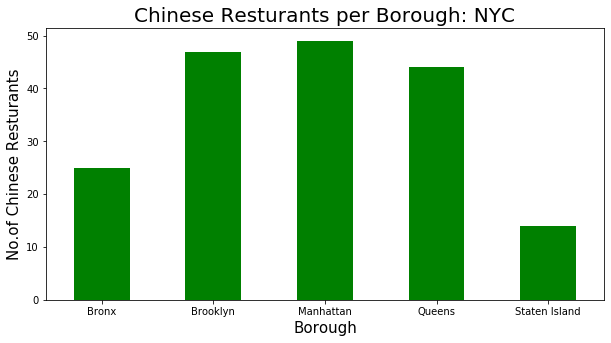

In [14]:
chinese_rest_ny.groupby('Borough')['ID'].count().plot.bar(figsize=(10,5), color = 'green')
plt.title('Chinese Resturants per Borough: NYC', fontsize = 20)
plt.xlabel('Borough', fontsize = 15)
plt.ylabel('No.of Chinese Resturants', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()

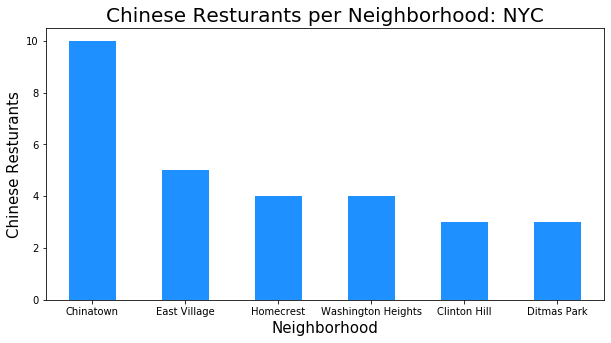

In [15]:
clr= "dodgerblue"
NOofNeigh = 6 # top number for graphing all the same past 6
chinese_rest_ny.groupby('Neighborhood')['ID'].count().nlargest(NOofNeigh).plot.bar(figsize=(10,5), color=clr)
plt.title('Chinese Resturants per Neighborhood: NYC', fontsize = 20)
plt.xlabel('Neighborhood', fontsize = 15)
plt.ylabel('Chinese Resturants', fontsize=15)
plt.xticks(rotation = 'horizontal')
plt.show()

In [7]:
chinese_rest_stats_ny = pd.read_csv('chinese_rest_stats_ny_csv.csv')
chinese_rest_stats_ny = chinese_rest_stats_ny[(chinese_rest_stats_ny.ID != '0')]
chinese_rest_stats_ny.index = range(len(chinese_rest_stats_ny))

In [36]:
chinese_rest_stats_ny[chinese_rest_stats_ny['Neighborhood']=='Chinatown']

,Unnamed: 0,Borough,Neighborhood,ID,Name,Likes,Rating,Tips
52,52,Manhattan,Chinatown,4db3374590a0843f295fb69b,Spicy Village,497.0,8.7,178.0
53,53,Manhattan,Chinatown,4a96bf8ff964a520ce2620e3,Wah Fung Number 1 Fast Food 華豐快飯店,185.0,8.3,92.0
54,54,Manhattan,Chinatown,5894c9a15e56b417cf79e553,Xi'an Famous Foods,101.0,8.9,29.0
55,55,Manhattan,Chinatown,3fd66200f964a520b1ea1ee3,Great N.Y. Noodletown,539.0,8.0,286.0
56,56,Manhattan,Chinatown,5c965dad5455b2002c058659,Yi Ji Shi Mo Noodle Corp,18.0,8.8,3.0
57,57,Manhattan,Chinatown,3fd66200f964a52067e61ee3,Joe's Shanghai 鹿嗚春,1302.0,8.5,567.0
58,58,Manhattan,Chinatown,46936ee3f964a520d0481fe3,Shanghai Café Deluxe,889.0,8.2,367.0
59,59,Manhattan,Chinatown,3fd66200f964a520ede41ee3,Big Wong King 大旺,417.0,8.3,185.0
60,60,Manhattan,Chinatown,59ad625a2619ee5cdded881f,House Special 甘來飯店,22.0,8.1,13.0
61,61,Manhattan,Chinatown,59d828f0916bc1155fde2c04,Hwa Yuan,61.0,7.7,16.0


In [37]:
chinese_rest_stats_ny[chinese_rest_stats_ny['Neighborhood']=='East Village']


,Unnamed: 0,Borough,Neighborhood,ID,Name,Likes,Rating,Tips
85,85,Manhattan,East Village,5c831f04029a550039fcca38,Chinese Graffiti,10.0,8.3,1.0
86,86,Manhattan,East Village,4c2a81398abca59393c8fe1f,Xi'an Famous Foods,862.0,8.9,319.0
87,87,Manhattan,East Village,5647ee82498e8bfc0ddef53d,Málà Project,420.0,8.9,91.0
88,88,Manhattan,East Village,5b0078680ff4f9002c1c94bd,Dian Kitchen,19.0,8.0,8.0
89,89,Manhattan,East Village,58d176db0b56560b9cad4cef,Little Tong Noodle Shop,153.0,8.3,34.0


Download details of Chinese restaurants from the Foursquare

In [47]:
column_names=['Borough', 'Neighborhood', 'ID','Name','Likes','Rating','Tips']
chinese_rest_stats_ny=pd.DataFrame(columns=column_names)
count=1
for row in chinese_rest_ny.values.tolist():
    Borough,Neighborhood,ID,Name=row
    try:
        venue_details=get_venue_details(ID)
        print(venue_details)
        id,name,likes,rating,tips=venue_details.values.tolist()[0]
    except IndexError:
        print('No data available for id=',ID)
        # we will assign 0 value for these resturants as they may have been 
        #recently opened or details does not exist in FourSquare Database
        id,name,likes,rating,tips=[0]*5
    print('(',count,'/',len(chinese_rest_ny),')','processed')
    chinese_rest_stats_ny = chinese_rest_stats_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name,
                                                'Likes' : likes,
                                                'Rating' : rating,
                                                'Tips' : tips
                                               }, ignore_index=True)
    count+=1
chinese_rest_stats_ny.tail()

{'meta': {'code': 429, 'errorType': 'quota_exceeded', 'errorDetail': 'Quota exceeded', 'requestId': '5deb8c8b02a1724a1472a103'}, 'response': {}}


KeyError: 'venue'

Alternatively, read venue details data from the saved file

In [73]:
chinese_rest_stats_ny = pd.read_csv('chinese_rest_stats_ny_csv.csv')
chinese_rest_stats_ny = chinese_rest_stats_ny[(chinese_rest_stats_ny.ID != '0')]
chinese_rest_stats_ny.index = range(len(chinese_rest_stats_ny))

Transform Likes, rating and Tips values to float format. Drop rows with ID=0

In [10]:
chinese_rest_stats_ny['Likes']=chinese_rest_stats_ny['Likes'].astype('float64')
chinese_rest_stats_ny['Tips']=chinese_rest_stats_ny['Tips'].astype('float64')
chinese_rest_stats_ny['Rating']=chinese_rest_stats_ny['Rating'].astype('float64')
chinese_rest_stats_ny = chinese_rest_stats_ny[(chinese_rest_stats_ny.ID != '0')]
chinese_rest_stats_ny.index = range(len(chinese_rest_stats_ny))
#chinese_rest_stats_ny.drop( chinese_rest_stats_ny['ID']==0, axis=0)
chinese_rest_stats_ny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 8 columns):
Unnamed: 0      114 non-null int64
Borough         114 non-null object
Neighborhood    114 non-null object
ID              114 non-null object
Name            114 non-null object
Likes           114 non-null float64
Rating          114 non-null float64
Tips            114 non-null float64
dtypes: float64(3), int64(1), object(4)
memory usage: 7.2+ KB


Calculate average rating of Chinese restaurants in each neighborhood

In [52]:
ny_neighborhood_stats=chinese_rest_stats_ny.groupby('Neighborhood',as_index=False).mean()[['Neighborhood','Rating']]
ny_neighborhood_stats.columns=['Neighborhood','Average Rating']
ny_neighborhood_stats.sort_values(['Average Rating'],ascending=False).head(10)

,Neighborhood,Average Rating
7,Chelsea,9.20
40,Lower East Side,9.10
21,Flatiron,9.10
39,Long Island City,9.00
64,West Village,8.95
61,Upper West Side,8.90
43,Midtown,8.80
59,Tribeca,8.80
44,Murray Hill,8.55
16,East Village,8.48


Calculate average rating of Chinese restaurants in each borough

In [54]:
ny_borough_stats=chinese_rest_stats_ny.groupby('Borough',as_index=False).mean()[['Borough','Rating']]
ny_borough_stats.columns=['Borough','Average Rating']
ny_borough_stats.sort_values(['Average Rating'],ascending=False).head()

,Borough,Average Rating
2,Manhattan,8.020408
3,Queens,7.313333
1,Brooklyn,7.208000
4,Staten Island,6.725000
0,Bronx,6.600000


### Show neighborhoods with different ratings on the map

In [55]:
ny_data = get_new_york_data()
ny_data.head()
chinese_rest_stats_ny = pd.read_csv('chinese_rest_stats_ny_csv.csv')
chinese_rest_stats_ny = chinese_rest_stats_ny[(chinese_rest_stats_ny.ID != '0')]
chinese_rest_stats_ny.index = range(len(chinese_rest_stats_ny))

ny_borough_stats=chinese_rest_stats_ny.groupby('Borough',as_index=False).mean()[['Borough','Rating']]
ny_borough_stats.columns=['Borough','Average Rating']

chinese_rest_stats_ny['Likes']=chinese_rest_stats_ny['Likes'].astype('float64')
chinese_rest_stats_ny['Tips']=chinese_rest_stats_ny['Tips'].astype('float64')
chinese_rest_stats_ny['Rating']=chinese_rest_stats_ny['Rating'].astype('float64')
chinese_rest_stats_ny.info()

#chinese_rest_stats_ny['Likes'].to_latex(index=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 8 columns):
Unnamed: 0      114 non-null int64
Borough         114 non-null object
Neighborhood    114 non-null object
ID              114 non-null object
Name            114 non-null object
Likes           114 non-null float64
Rating          114 non-null float64
Tips            114 non-null float64
dtypes: float64(3), int64(1), object(4)
memory usage: 7.2+ KB


In [92]:
##################
address = 'New York City, NY'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

# create map and display it
ny_map = folium.Map(location=[latitude, longitude], zoom_start=12)
# instantiate a feature group for the restaurants in the dataframe

ny_geo = 'Borough Boundaries.geojson'
ny_map.choropleth(
    geo_data=ny_geo,
    data=ny_borough_stats,
    columns=['Borough', 'Average Rating'],
    key_on='feature.properties.boro_name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Average Rating'
)

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [93]:
##################
ny_neighborhood_stats8=chinese_rest_stats_ny.groupby('Neighborhood',as_index=False).mean()[['Neighborhood','Rating']]
ny_neighborhood_stats8.columns=['Neighborhood','Average Rating']
ny_neighborhood_stats8.sort_values(['Average Rating'],ascending=False).head(10)

ny_neighborhood_stats8=ny_neighborhood_stats8[ny_neighborhood_stats8['Average Rating']>=8.0]
ny_neighborhood_stats8=pd.merge(ny_neighborhood_stats8,ny_data, on='Neighborhood')
ny_neighborhood_stats8=ny_neighborhood_stats8[['Borough','Neighborhood','Latitude','Longitude','Average Rating']]
#ny_neighborhood_stats

restaurants8 = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in ny_neighborhood_stats8[['Latitude','Longitude']].values:
    restaurants8.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6,
            weight=0
        )
    )
ny_map.add_child(restaurants8)

In [94]:
###################
ny_neighborhood_stats58=chinese_rest_stats_ny.groupby('Neighborhood',as_index=False).mean()[['Neighborhood','Rating']]
ny_neighborhood_stats58.columns=['Neighborhood','Average Rating']
ny_neighborhood_stats58.sort_values(['Average Rating'],ascending=False).head(10)
ny_neighborhood_stats58=ny_neighborhood_stats58[ny_neighborhood_stats58['Average Rating']>=5.0]
ny_neighborhood_stats58=ny_neighborhood_stats58[ny_neighborhood_stats58['Average Rating']<8.0]
#
ny_neighborhood_stats58=pd.merge(ny_neighborhood_stats58,ny_data, on='Neighborhood')
ny_neighborhood_stats58=ny_neighborhood_stats58[['Borough','Neighborhood','Latitude','Longitude','Average Rating']]
#ny_neighborhood_stats

restaurants58 = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in ny_neighborhood_stats58[['Latitude','Longitude']].values:
    restaurants58.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='red',
            fill_opacity=0.6,
             weight=0
        )
    )
ny_map.add_child(restaurants58)
####################

In [87]:
ny_geo = 'Borough Boundaries.geojson'
ny_map.choropleth(
    geo_data=ny_geo,
    data=ny_borough_stats,
    columns=['Borough', 'Average Rating'],
    key_on='feature.properties.boro_name',
    fill_color='YlOrRd', 
    fill_opacity=0.0, 
    line_opacity=0.2,
    legend_name='Average Rating'
)


In [95]:
ny_map.save('borough_rating.html')

In [98]:
from IPython.display import IFrame
IFrame(src='./borough_rating.html', width=1200, height=1000)

Find neighborhoods without Chinese restaurants 

In [39]:
ny_data = get_new_york_data()
chinese_rest_ny = pd.read_csv('chinese_rest_ny_tocsv1.csv')
chinese_rest_ny = chinese_rest_ny[(chinese_rest_ny.ID != '0')]
chinese_rest_ny.index = range(len(chinese_rest_ny))
#ny_data.head()
column_names=['Borough', 'Neighborhood']
NOchinese_rest_ny=pd.DataFrame(columns=column_names)
count=1
for row in ny_data.values.tolist():
    Borough, Neighborhood, Latitude, Longitude=row
    if ((Neighborhood in chinese_rest_ny['Neighborhood'].values.tolist())==False):
        NOchinese_rest_ny = NOchinese_rest_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                     }, ignore_index=True)
 

In [36]:
 chinese_rest_ny['Neighborhood']

0              Eastchester
1           Pelham Parkway
2           Pelham Parkway
3             Bedford Park
4             Bedford Park
              ...         
174              Homecrest
175               Allerton
176    Kingsbridge Heights
177                Erasmus
178                Erasmus
Name: Neighborhood, Length: 179, dtype: object

Calculate the number of neighborhoods without Chinese restaurants in different boroughs 

In [41]:
NOchinese_rest_ny[NOchinese_rest_ny['Borough']=='Manhattan'].count()

Borough         18
Neighborhood    18
dtype: int64

In [42]:
NOchinese_rest_ny[NOchinese_rest_ny['Borough']=='Bronx'].count()

Borough         33
Neighborhood    33
dtype: int64

In [43]:
NOchinese_rest_ny[NOchinese_rest_ny['Borough']=='Brooklyn'].count()


Borough         42
Neighborhood    42
dtype: int64

Create map to show neighborhoods without Chinese restaurants 

In [54]:
##################
address = 'New York City, NY'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

# create map and display it
ny_map1 = folium.Map(location=[latitude, longitude], zoom_start=12)
# instantiate a feature group for the restaurants in the dataframe


The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [55]:
NOchinese_rest_Manh=NOchinese_rest_ny[NOchinese_rest_ny['Borough']=='Queens']

NOchinese_rest_Manh=pd.merge(NOchinese_rest_Manh,ny_data, on='Neighborhood')

NOchinese_rest_Manh=NOchinese_rest_Manh[NOchinese_rest_Manh['Borough_x']=='Queens']
NOchinese_rest_Manh=NOchinese_rest_Manh[NOchinese_rest_Manh['Borough_y']=='Queens']

NOchinese_rest_Manh=NOchinese_rest_Manh[['Neighborhood','Latitude','Longitude']]
#ny_neighborhood_stats

restaurants = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in NOchinese_rest_Manh[['Latitude','Longitude']].values:
    restaurants.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='black',
            fill_opacity=0.6,
             weight=0
        )
    )
ny_map1.add_child(restaurants)
####################

In [56]:
NOchinese_rest_Manh=NOchinese_rest_ny[NOchinese_rest_ny['Borough']=='Brooklyn']

NOchinese_rest_Manh=pd.merge(NOchinese_rest_Manh,ny_data, on='Neighborhood')
NOchinese_rest_Manh=NOchinese_rest_Manh[NOchinese_rest_Manh['Borough_x']=='Brooklyn']
NOchinese_rest_Manh=NOchinese_rest_Manh[NOchinese_rest_Manh['Borough_y']=='Brooklyn']
NOchinese_rest_Manh=NOchinese_rest_Manh[['Neighborhood','Latitude','Longitude']]
#ny_neighborhood_stats

restaurants = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in NOchinese_rest_Manh[['Latitude','Longitude']].values:
    restaurants.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='green',
            fill_opacity=0.6,
             weight=0
        )
    )
ny_map1.add_child(restaurants)
####################

In [57]:
NOchinese_rest_Manh=NOchinese_rest_ny[NOchinese_rest_ny['Borough']=='Bronx']

NOchinese_rest_Manh=pd.merge(NOchinese_rest_Manh,ny_data, on='Neighborhood')
NOchinese_rest_Manh=NOchinese_rest_Manh[NOchinese_rest_Manh['Borough_x']=='Bronx']
NOchinese_rest_Manh=NOchinese_rest_Manh[NOchinese_rest_Manh['Borough_y']=='Bronx']

NOchinese_rest_Manh=NOchinese_rest_Manh[['Neighborhood','Latitude','Longitude']]
#ny_neighborhood_stats

restaurants = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in NOchinese_rest_Manh[['Latitude','Longitude']].values:
    restaurants.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6,
             weight=0
        )
    )
ny_map1.add_child(restaurants)
####################

In [58]:
NOchinese_rest_Manh=NOchinese_rest_ny[NOchinese_rest_ny['Borough']=='Manhattan']

NOchinese_rest_Manh=pd.merge(NOchinese_rest_Manh,ny_data, on='Neighborhood')
NOchinese_rest_Manh=NOchinese_rest_Manh[NOchinese_rest_Manh['Borough_x']=='Manhattan']
NOchinese_rest_Manh=NOchinese_rest_Manh[NOchinese_rest_Manh['Borough_y']=='Manhattan']

NOchinese_rest_Manh=NOchinese_rest_Manh[['Neighborhood','Latitude','Longitude']]
#ny_neighborhood_stats

restaurants = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in NOchinese_rest_Manh[['Latitude','Longitude']].values:
    restaurants.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='red',
            fill_opacity=0.6,
             weight=0
        )
    )
ny_map1.add_child(restaurants)
####################

In [59]:
ny_map1.save('NoChineseRestaurant.html')

In [ ]:
Mark the neigborhoods with largest ratings if Chinese restaurants

In [22]:
##################
address = 'New York City, NY'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

# create map and display it
ny_map2 = folium.Map(location=[latitude, longitude], zoom_start=12)
# instantiate a feature group for the restaurants in the dataframe


The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [23]:
Bestchinese_rest=pd.merge(Best10Neighborhoods,ny_data, on='Neighborhood')

Bestchinese_rest=Bestchinese_rest[['Neighborhood','Latitude','Longitude']]
#ny_neighborhood_stats

restaurants = folium.map.FeatureGroup()
# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in Bestchinese_rest[['Latitude','Longitude']].values:
    restaurants.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=10, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6,
             weight=0
        )
    )
ny_map2.add_child(restaurants)
####################

ny_map2.save('BNChineseRestaurant.html')